# Single Image Super Resolution with ESPCN

This is an implementation of ESPCN using Tensorflow.  
ESPCN is a single image super resolution algorithm proposed in https://arxiv.org/pdf/1609.05158.pdf.  
This is a blog post about ESPCN: https://medium.com/@zhuocen93/an-overview-of-espcn-an-efficient-sub-pixel-convolutional-neural-network-b76d0a6c875e.


There are several differences between my implementation and the original paper:
1. I use 64x64 sub-images with stride 48. 
2. I use paddings so that the size of upscaled images remain the same.
3. My model takes input with 3 channels (RGB) instead of 1 luminance channel in YCbCr.  
4. My model uses ReLU instead of tanh as activation function.
5. The learning rate is constant and the same for all layers in my model.  
6. I use DIV2K dataset for training.  

In [1]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
from custom_image_dataset_from_directory import image_dataset_from_directory
import matplotlib.pyplot as plt
import os
from PIL import Image
import utils

In [2]:
upscale_factor = 4
batch_size = 32

# Size for the training images
lr_image_size = (64,64) 
hr_image_size = (lr_image_size[0] * upscale_factor, lr_image_size[1] * upscale_factor)

# Stride for the cropping images
lr_stride = (lr_image_size[0] * 3 // 4, lr_image_size[1] * 3 // 4) 
hr_stride = (lr_stride[0] * upscale_factor, lr_stride[1] * upscale_factor)

model_dir = 'models'

# 1. Data Preprocessing

DIV2K is used for training.  
Set5, Set14, B100, Urban100, Manga109 can be used for testing.

Training images are cropped into square sub images of train_image_size using the custom image_dataset_from_directory() function.  
Note that ```image_dataset_from_directory()``` is modified from the tensorflow source code (https://github.com/keras-team/keras/blob/v2.7.0/keras/preprocessing/image_dataset.py#L30-L227) for generating the dataset with cropping rather than the default ```smart_resize()```. Set crop_to_aspect_ratio=True if you want to use the ```smart_resize()```.

In [3]:
# Load the DIV2K dataset
train_lr_dir = 'data/DIV2K/train/LRx4_bicubic'
train_hr_dir = 'data/DIV2K/train/HR'

train_lr_images = image_dataset_from_directory(train_lr_dir, image_size=lr_image_size, stride=lr_stride, batch_size=batch_size, shuffle=False, crop_to_aspect_ratio=False, label_mode=None)
train_hr_images = image_dataset_from_directory(train_hr_dir, image_size=hr_image_size, stride=hr_stride, batch_size=batch_size, shuffle=False, crop_to_aspect_ratio=False, label_mode=None)

# Validation dataset
val_lr_dir = 'data/DIV2K/validation/LRx4_bicubic'
val_hr_dir = 'data/DIV2K/validation/HR'

val_lr_images = image_dataset_from_directory(val_lr_dir, image_size=lr_image_size, stride=lr_stride, batch_size=batch_size, shuffle=False, crop_to_aspect_ratio=False, label_mode=None)
val_hr_images = image_dataset_from_directory(val_hr_dir, image_size=hr_image_size, stride=hr_stride, batch_size=batch_size, shuffle=False, crop_to_aspect_ratio=False, label_mode=None)

Found 800 files belonging to 1 classes.
Metal device set to: Apple M1

systemMemory: 16.00 GB
maxCacheSize: 5.33 GB

Found 800 files belonging to 1 classes.
Found 100 files belonging to 1 classes.
Found 100 files belonging to 1 classes.


2022-01-01 02:35:16.724461: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-01-01 02:35:16.724557: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Only run the the block below for debug / if you really want to know the number of sub-images created.  
It takes 2 minutes for the DIV2K dataset, which has 800 images

In [4]:
# def num_elements_in_dataset(ds):
#     num_elements = 0
#     it = iter(ds)
#     for batch in it:
#         num_elements += batch.shape[0]
#     return num_elements

# print("Number of sub-images in LR training set:", num_elements_in_dataset(train_lr_images))
# print("Number of sub-images in HR training set:", num_elements_in_dataset(train_hr_images))
# print("Number of sub-images in LR validation set:", num_elements_in_dataset(val_lr_images))
# print("Number of sub-images in HR validation set:", num_elements_in_dataset(val_hr_images))

In [5]:
# Normalize the images
normalize = layers.Rescaling(1./255)
train_lr_images = train_lr_images.map(lambda batch: normalize(batch))
train_hr_images = train_hr_images.map(lambda batch: normalize(batch))
val_lr_images = val_lr_images.map(lambda batch: normalize(batch))
val_hr_images = val_hr_images.map(lambda batch: normalize(batch))

# Produce the (input, target) dataset for training
train_ds = tf.data.Dataset.zip((train_lr_images, train_hr_images))
val_ds = tf.data.Dataset.zip((val_lr_images, val_hr_images))

train_ds = train_ds.shuffle(batch_size*2, reshuffle_each_iteration=True)

2022-01-01 02:35:16.982488: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


(64, 64, 3) (256, 256, 3)


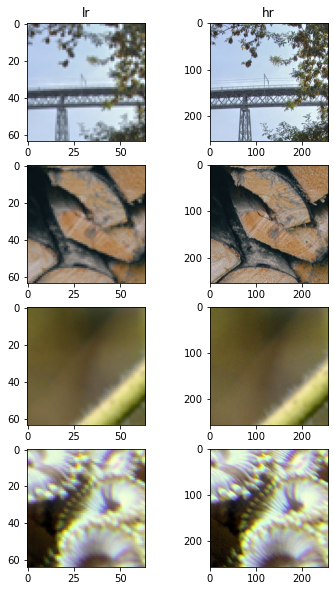

In [6]:
# Visualize Training Data
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(6,10))

for i in range(4):
    image = next(iter(train_ds))
    ax[i][0].imshow(image[0][i].numpy().astype('float32'))
    ax[i][1].imshow(image[1][i].numpy().astype('float32'))

ax[0][0].set_title("lr")
ax[0][1].set_title("hr")

print(image[0][i].numpy().shape, image[1][i].numpy().shape)

# 2. Train Model

In [5]:
def espcn():
    """Return the espcn model"""
    input = tf.keras.Input(shape=(None, None, 3))
    layer1 = layers.Conv2D(64, (5,5), padding="same")(input)
    layer1_relu = layers.ReLU()(layer1)
    layer2 = layers.Conv2D(32, (3,3), padding="same")(layer1_relu)
    layer2_relu = layers.ReLU()(layer2)
    layer3 = layers.Conv2D(3 * upscale_factor * upscale_factor, (3,3), padding="same")(layer2_relu)
    output = tf.nn.depth_to_space(layer3, upscale_factor)

    model = models.Model(inputs=input, outputs=output)
    return model

In [6]:
model = espcn()
model.summary()
model.compile(optimizer=tf.optimizers.Adam(learning_rate=0.0001),
              loss=tf.keras.losses.MeanSquaredError(),
              metrics=['mse'])
_ = tf.keras.utils.plot_model(model, to_file=os.path.join(model_dir, 'ESPCN.png'), show_shapes=True)

Metal device set to: Apple M1

systemMemory: 16.00 GB
maxCacheSize: 5.33 GB

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 conv2d (Conv2D)             (None, None, None, 64)    4864      
                                                                 
 re_lu (ReLU)                (None, None, None, 64)    0         
                                                                 
 conv2d_1 (Conv2D)           (None, None, None, 32)    18464     
                                                                 
 re_lu_1 (ReLU)              (None, None, None, 32)    0         
                                                                 
 conv2d_2 (Conv2D)           (None, None, None, 48)    13872     
                                                  

2022-01-10 22:39:24.731705: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-01-10 22:39:24.732449: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [9]:
# earlyStopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)
history = model.fit(train_ds, validation_data=val_ds, epochs=100, verbose=1, batch_size=batch_size)

Epoch 1/100


2022-01-01 02:35:32.718938: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


   1961/Unknown - 181s 90ms/step - loss: 0.0120 - mse: 0.0120

2022-01-01 02:38:33.544785: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


1961/1961 [==============================] - 196s 98ms/step - loss: 0.0120 - mse: 0.0120 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 2/100
  29/1961 [..............................] - ETA: 2:44 - loss: 0.0042 - mse: 0.0042

KeyboardInterrupt: 

In [ ]:
# Save model
# model.save_weights(os.path.join(model_dir, 'espcn_x4.h5'))

[]

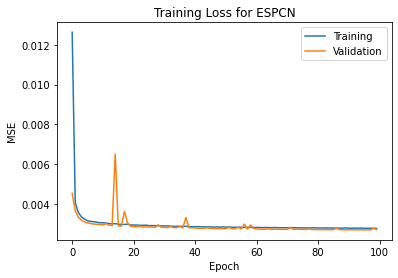

In [ ]:
fig, ax = plt.subplots(figsize=(6,4))
ax.plot(history.history['loss'], label='Training')
ax.plot(history.history['val_loss'], label='Validation')
ax.set_xlabel("Epoch")
ax.set_ylabel("MSE")
ax.set_title("Training Loss for ESPCN")
ax.legend()
ax.plot()

# 3. Evaluation

In [7]:
model.load_weights(os.path.join(model_dir, 'espcn_x4.h5'))

Because we are going to evaluate on images with different sizes, we cannot load them as a dataset like the training and validation dataset above.  
We need to load the images to numpy arrays ourselves, and then predict them one by one.  

Some datasets only provide HR images, so we need to downscale it ourselves.  
Also, an upscale function is implemented for upscaling LR images with bicubic interpolation for comparison.

### Validation Set

In [3]:
# Load the DIV2K validation dataset
val_hr_dir = 'data/DIV2K/validation/HR'
# val_lr_dir = 'data/DIV2K/validation/LRx4_unknown' # This is more difficult than bicubic downgrade
val_hr_images = utils.image_array_from_directory(val_hr_dir, downscale_factor=upscale_factor, limit=5)
val_lr_images = utils.image_array_from_directory(val_hr_dir, downscale_factor=upscale_factor, downscale=True, limit=5)

# Upscale with bicubic interpolation as baseline
bicubic_val_lr_images = []
for image in val_lr_images:
    image = tf.keras.preprocessing.image.array_to_img(image * 255)
    image = utils.upscale_image(image, upscale_factor)
    image = tf.keras.preprocessing.image.img_to_array(image)
    bicubic_val_lr_images.append(image / 255)
    

5 images loaded from data/DIV2K/validation/HR.
5 images downscaled by a factor of 4 from data/DIV2K/validation/HR.


In [8]:
# Make predictions on validation set
predictions = []
for image in val_lr_images:
    hr = model.predict(np.expand_dims(image, axis=0))[0]
    hr = tf.clip_by_value(hr, 0, 1)
    predictions.append(hr)
    if len(predictions) > 5:
        break

psnr_bicubic = []
psnr_srcnn = []
for i in range(len(predictions)):
    psnr_bicubic.append(tf.image.psnr(bicubic_val_lr_images[i], val_hr_images[i], 1.0).numpy())
    psnr_srcnn.append(tf.image.psnr(predictions[i], val_hr_images[i], 1.0).numpy())
psnr_bicubic = np.array(psnr_bicubic)
psnr_srcnn = np.array(psnr_srcnn)

print("PSNR (Bicubic):", np.average(psnr_bicubic))
print("PSNR (ESPCN):", np.average(psnr_srcnn))

2022-01-10 22:39:38.622351: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-01-10 22:39:38.681606: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-01-10 22:39:38.927121: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-01-10 22:39:39.044727: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


PSNR (Bicubic): 28.847467
PSNR (ESPCN): 30.488897


Text(0.5, 1.0, 'Ground Truth')

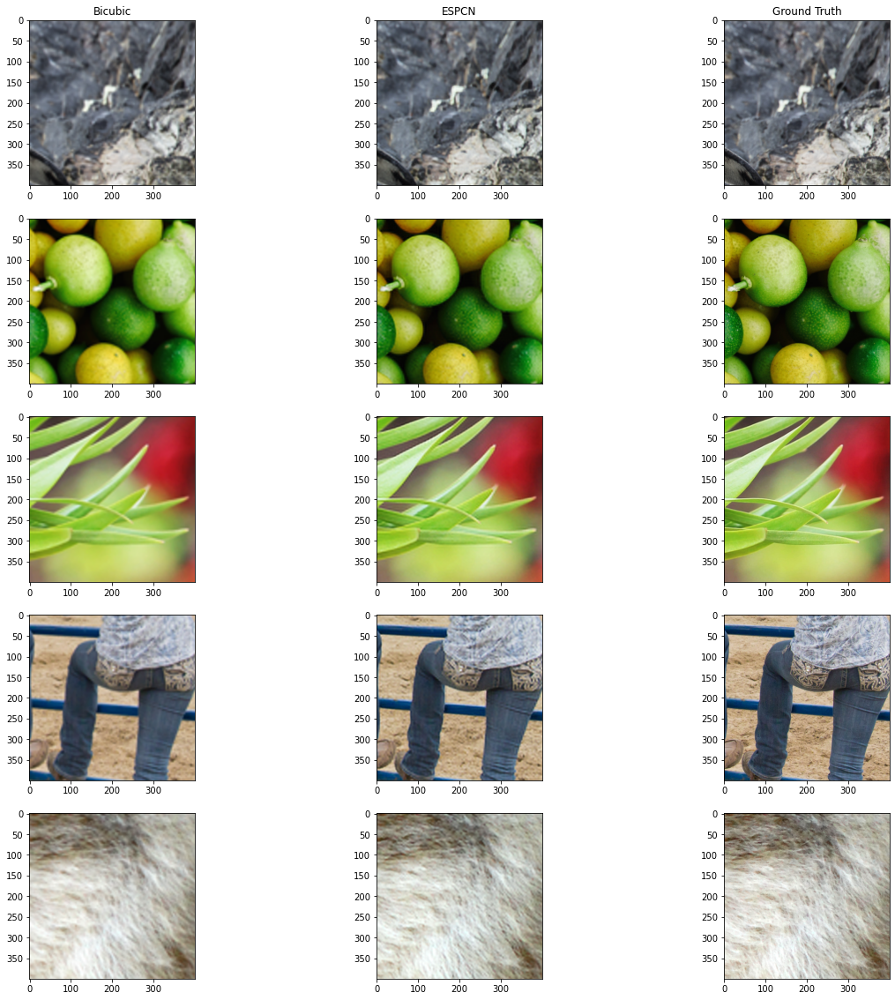

In [9]:
fig, ax = plt.subplots(nrows=5, ncols=3, figsize=(20, 20))

plot_size = 400
for i in range(5):
    x = np.random.randint(0, val_hr_images[i].shape[0]-plot_size)
    y = np.random.randint(0, val_hr_images[i].shape[1]-plot_size)
    ax[i][0].imshow(bicubic_val_lr_images[i][x:x+plot_size, y:y+plot_size,:])
    ax[i][1].imshow(predictions[i][x:x+plot_size, y:y+plot_size,:])
    ax[i][2].imshow(val_hr_images[i][x:x+plot_size, y:y+plot_size,:])

ax[0][0].set_title("Bicubic")
ax[0][1].set_title("ESPCN")
ax[0][2].set_title("Ground Truth")

### Set5

In [22]:
# Load the Set5 dataset
set5_hr_dir = 'data/Set5'
set5_hr_images = utils.image_array_from_directory(set5_hr_dir, downscale_factor=upscale_factor)
set5_lr_images = utils.image_array_from_directory(set5_hr_dir, downscale_factor=upscale_factor, downscale=True)

# Bicubic interpolation for comparison
bicubic_set5_lr_images = []
for image in set5_lr_images:
    image = tf.keras.preprocessing.image.array_to_img(image * 255)
    image = utils.upscale_image(image, upscale_factor)
    image = tf.keras.preprocessing.image.img_to_array(image)
    bicubic_set5_lr_images.append(image / 255)

5 images loaded from data/Set5.
5 images downscaled by a factor of 4 from data/Set5.


In [23]:
# Make predictions on Set5
predictions = []
for image in set5_lr_images:
    hr = model.predict(np.expand_dims(image, axis=0))[0]
    hr = tf.clip_by_value(hr, 0, 1)
    predictions.append(hr)

psnr_bicubic = []
psnr_espcn = []
for i in range(len(predictions)):
    psnr_bicubic.append(tf.image.psnr(bicubic_set5_lr_images[i], set5_hr_images[i], 1.0).numpy())
    psnr_espcn.append(tf.image.psnr(predictions[i], set5_hr_images[i], 1.0).numpy())
psnr_bicubic = np.array(psnr_bicubic)
psnr_espcn = np.array(psnr_espcn)

print("PSNR (Bicubic):", np.average(psnr_bicubic), psnr_bicubic)
print("PSNR (ESPCN):", np.average(psnr_espcn), psnr_espcn)

2021-12-31 23:13:31.794831: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


PSNR (Bicubic): 26.59675 [30.416115 28.068218 20.456728 28.963413 25.079266]
PSNR (ESPCN): 28.044678 [31.492336 29.731909 22.7989   29.366997 26.83324 ]


Text(0.5, 1.0, 'Ground Truth')

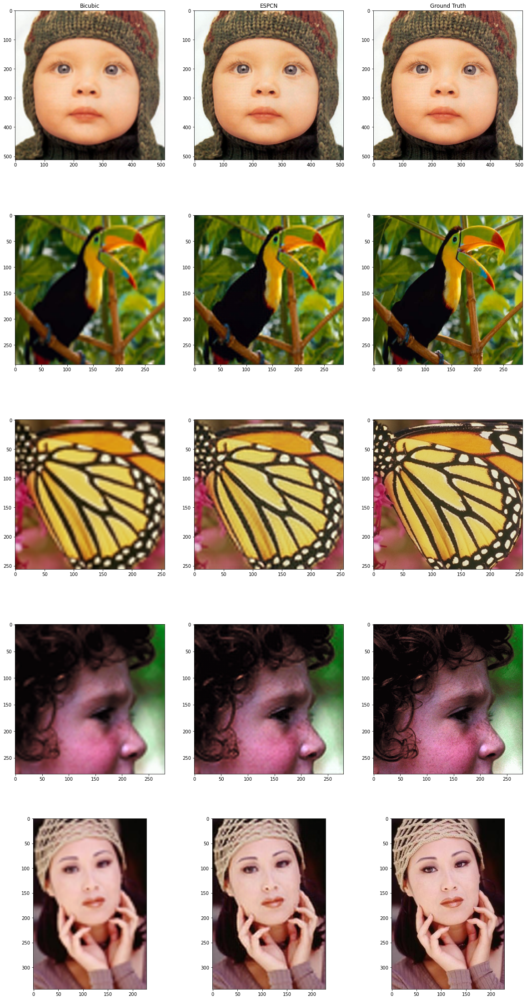

In [24]:
fig, ax = plt.subplots(nrows=5, ncols=3, figsize=(20, 40))

for i in range(5):
    ax[i][0].imshow(bicubic_set5_lr_images[i])
    ax[i][1].imshow(predictions[i])
    ax[i][2].imshow(set5_hr_images[i])

ax[0][0].set_title("Bicubic")
ax[0][1].set_title("ESPCN")
ax[0][2].set_title("Ground Truth")

### Set14

In [25]:
# Load the Set14 dataset
set14_hr_dir = 'data/Set14'
set14_hr_images = utils.image_array_from_directory(set14_hr_dir, downscale_factor=upscale_factor)
set14_lr_images = utils.image_array_from_directory(set14_hr_dir, downscale_factor=upscale_factor, downscale=True)

# Bicubic interpolation for comparison
bicubic_set14_lr_images = []
for image in set14_lr_images:
    image = tf.keras.preprocessing.image.array_to_img(image * 255)
    image = utils.upscale_image(image, upscale_factor)
    image = tf.keras.preprocessing.image.img_to_array(image)
    bicubic_set14_lr_images.append(image / 255)

14 images loaded from data/Set14.
14 images downscaled by a factor of 4 from data/Set14.


In [26]:
# Make predictions on Set14
predictions = []
for image in set14_lr_images:
    hr = model.predict(np.expand_dims(image, axis=0))[0]
    hr = tf.clip_by_value(hr, 0, 1)
    predictions.append(hr)

psnr_bicubic = []
psnr_espcn = []
for i in range(len(predictions)):
    psnr_bicubic.append(tf.image.psnr(bicubic_set14_lr_images[i], set14_hr_images[i], 1.0).numpy())
    psnr_espcn.append(tf.image.psnr(predictions[i], set14_hr_images[i], 1.0).numpy())
psnr_bicubic = np.array(psnr_bicubic)
psnr_espcn = np.array(psnr_espcn)

print("PSNR (Bicubic):", np.average(psnr_bicubic))
print("PSNR (ESPCN):", np.average(psnr_espcn))

PSNR (Bicubic): 23.864874
PSNR (ESPCN): 25.291605


Text(0.5, 1.0, 'Ground Truth')

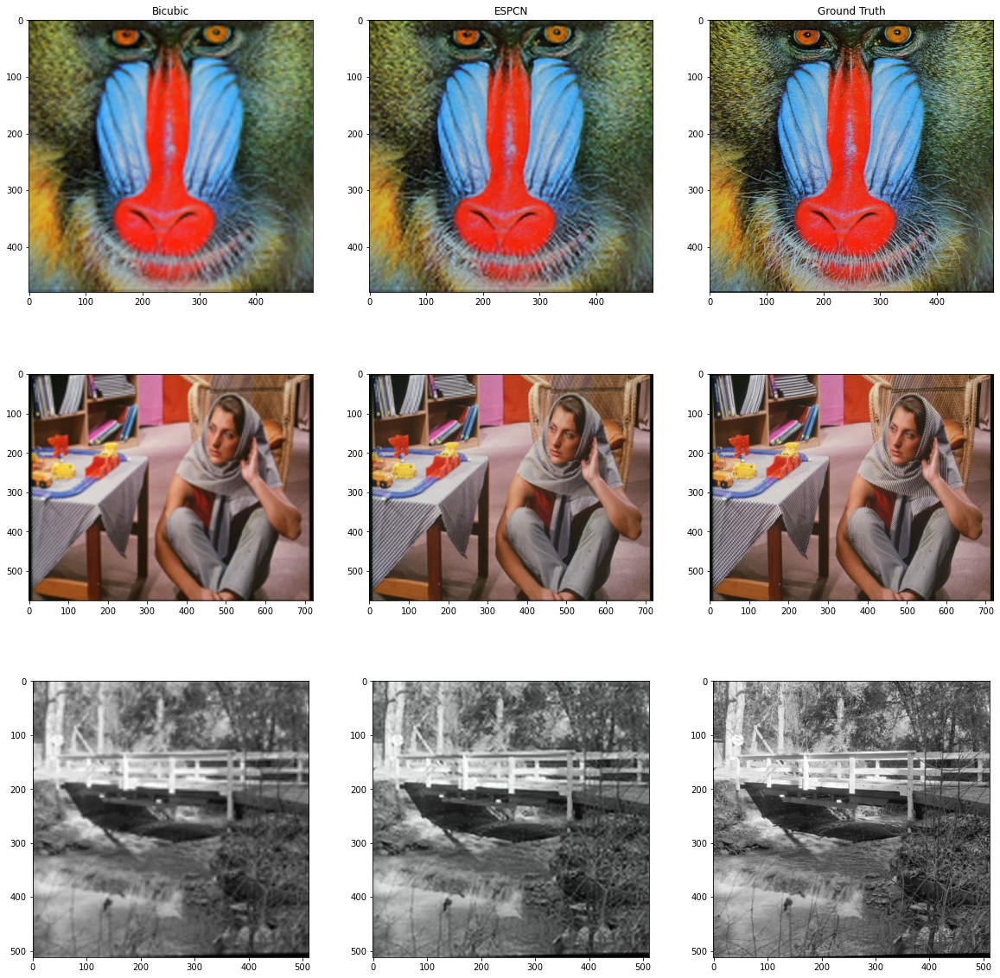

In [27]:
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(20, 20))

for i in range(3):
    ax[i][0].imshow(bicubic_set14_lr_images[i])
    ax[i][1].imshow(predictions[i])
    ax[i][2].imshow(set14_hr_images[i])

ax[0][0].set_title("Bicubic")
ax[0][1].set_title("ESPCN")
ax[0][2].set_title("Ground Truth")

## Visualizing Layer Outputs

In [28]:
from keras import backend as K

In [29]:
input_image = set5_lr_images[2]

outputs = []
for layer in model.layers:
    print(layer.name)
    keras_function = K.function([model.input], [layer.output])
    outputs.append(keras_function([np.expand_dims(input_image, axis=0)]))

input_2
conv2d_3
re_lu_2
conv2d_4
re_lu_3
conv2d_5
tf.nn.depth_to_space_1


Input image: (256, 256, 3)


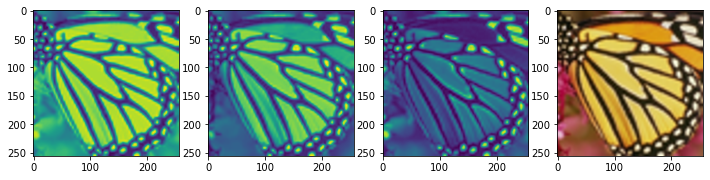

In [30]:
print("Input image:", input_image.shape)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(12,4))
for i in range(3):
    ax[i].imshow(input_image[:,:,i])
ax[3].imshow(input_image)

First Layer Output: (256, 256, 64)


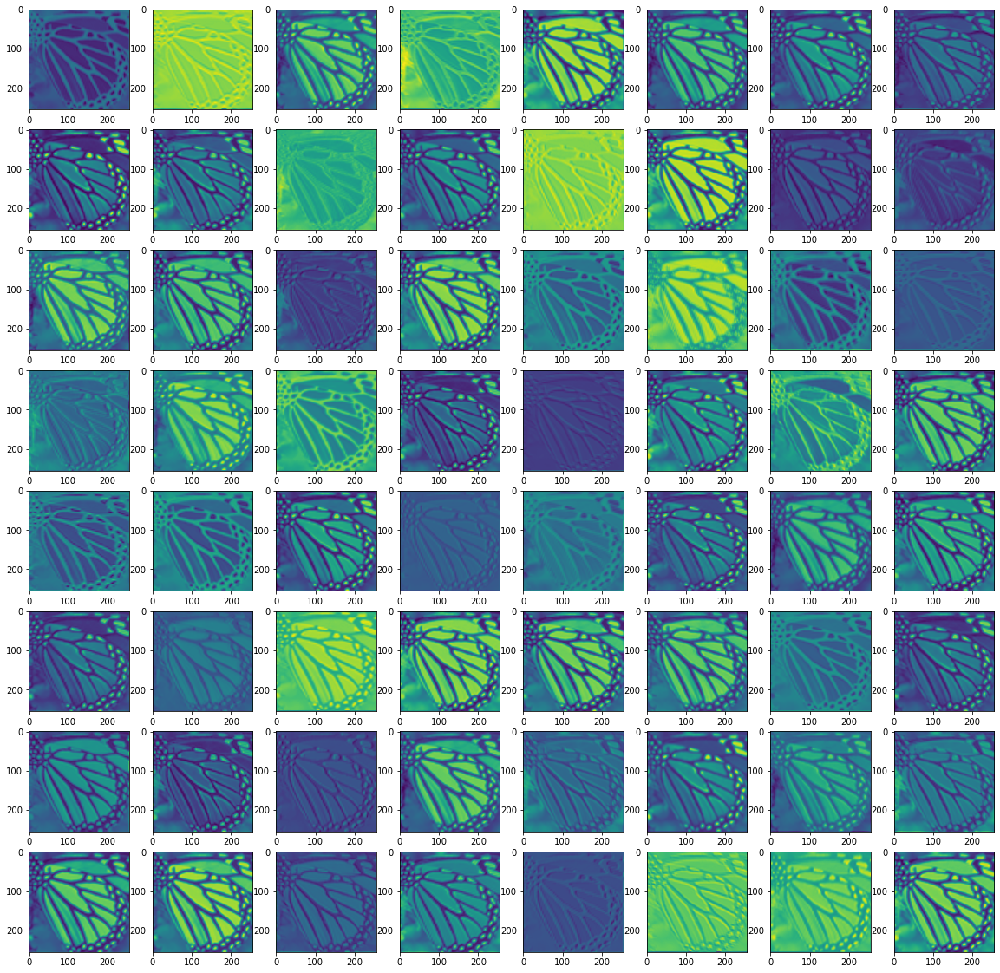

In [31]:
print("First Layer Output:", np.array(outputs[1][0][0]).shape)

fig, ax = plt.subplots(nrows=8, ncols=8, figsize=(20,20))
layer0_outputs = np.array(outputs[1][0][0])
for i in range(layer0_outputs.shape[-1]):
    ax[i//8][i%8].imshow(layer0_outputs[:,:,i])

First Layer Output (After activation): (256, 256, 64)


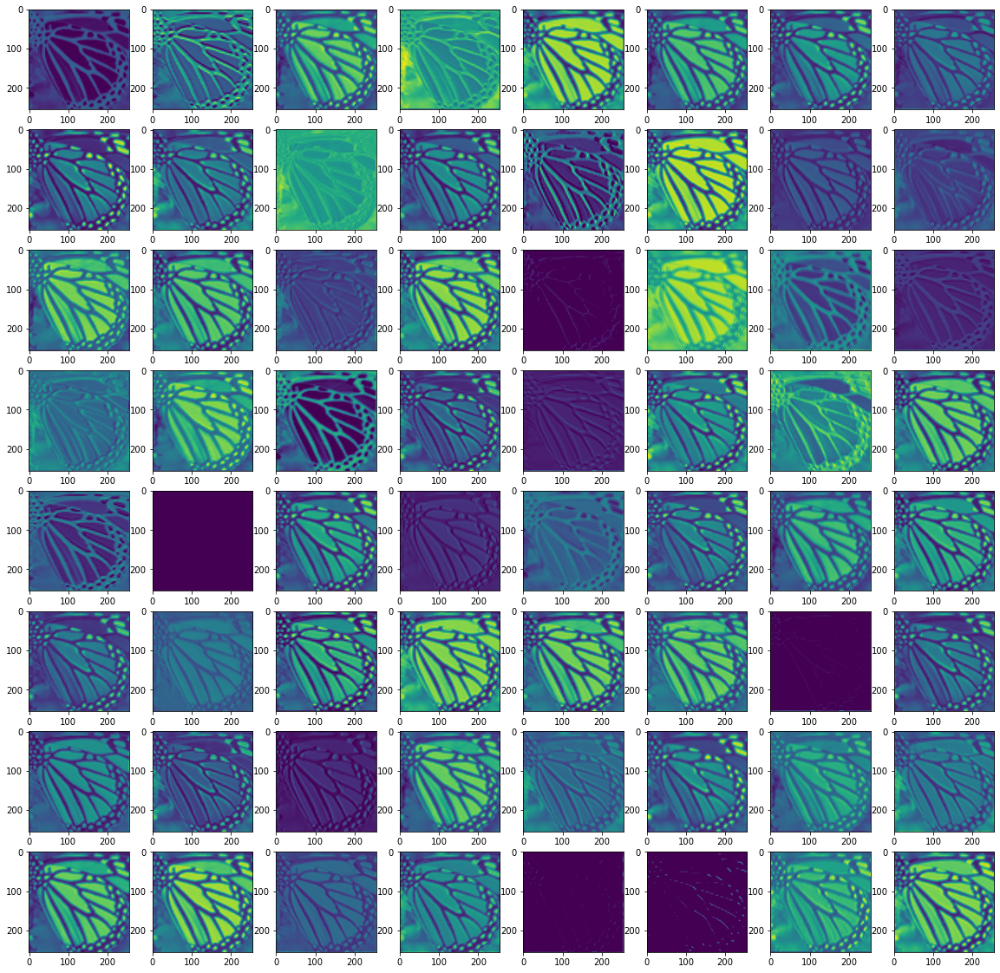

In [32]:
print("First Layer Output (After activation):", np.array(outputs[2][0][0]).shape)

fig, ax = plt.subplots(nrows=8, ncols=8, figsize=(20,20))
layer1_outputs = np.array(outputs[2][0][0])
for i in range(layer1_outputs.shape[-1]):
    ax[i//8][i%8].imshow(layer1_outputs[:,:,i])

Second Layer Output: (256, 256, 32)


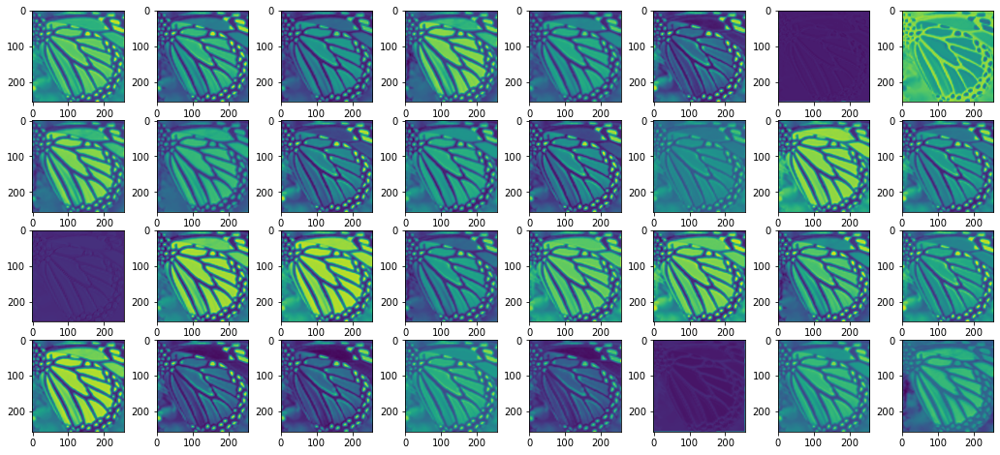

In [33]:
print("Second Layer Output:", np.array(outputs[3][0][0]).shape)

fig, ax = plt.subplots(nrows=4, ncols=8, figsize=(18,8))
layer2_outputs = np.array(outputs[3][0][0])
for i in range(layer2_outputs.shape[-1]):
    ax[i//8][i%8].imshow(layer2_outputs[:,:,i])

Second Layer Output (After activation): (256, 256, 32)


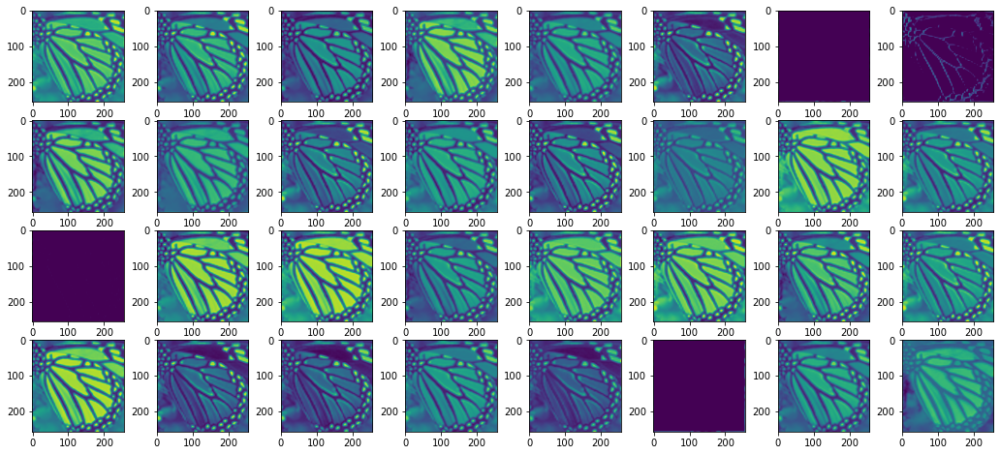

In [34]:
print("Second Layer Output (After activation):", np.array(outputs[4][0][0]).shape)

fig, ax = plt.subplots(nrows=4, ncols=8, figsize=(18,8))
layer3_outputs = np.array(outputs[4][0][0])
for i in range(layer3_outputs.shape[-1]):
    ax[i//8][i%8].imshow(layer3_outputs[:,:,i])

Sub-pixel Layer Output: (256, 256, 48)


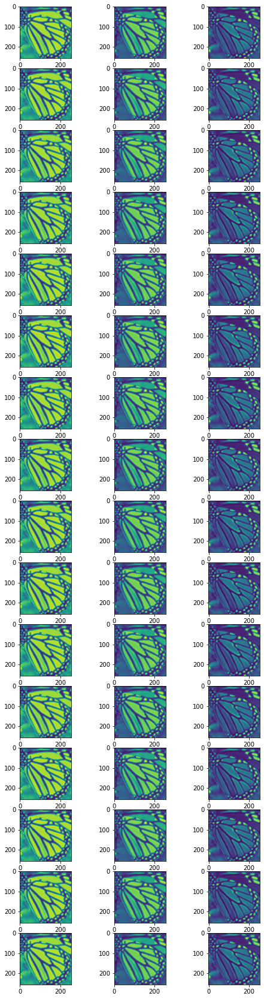

In [35]:
print("Sub-pixel Layer Output:", np.array(outputs[5][0][0]).shape)

fig, ax = plt.subplots(nrows=16, ncols=3, figsize=(8,30))
layer4_outputs = np.array(outputs[5][0][0])
for i in range(layer4_outputs.shape[-1]):
    ax[i//3][i%3].imshow(layer4_outputs[:,:,i])